# Solving 1-D Schrodinger Equation with quadratic potential
## Import required packages

In [2]:
import numpy as np

from scipy import integrate
from scipy import sparse
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
plt.rc('savefig', dpi=300)
plt.rcParams['text.usetex'] = True
plt.rcParams["figure.figsize"] = (24,8)
plt.rcParams['font.size'] = 20
plt.rcParams['legend.fontsize'] = 40

## Set initial conditions

Total Probability:  0.9999999999999992


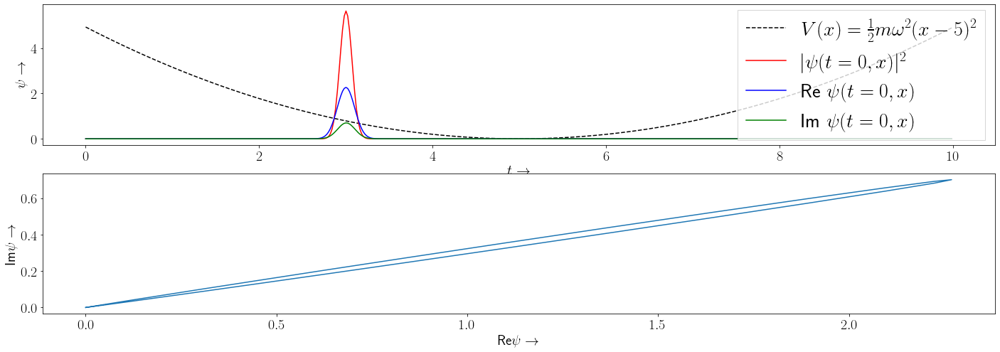

In [4]:
dx    = 0.02                       # spatial separation
x     = np.arange(0, 10, dx)       # spatial grid points

kx    = 0.1                        # wave number
m     = 1                          # mass
sigma = 0.1                        # width of initial gaussian wave-packet
x0    = 3.0                        # center of initial gaussian wave-packet

A = 1.0 / (sigma * np.sqrt(np.pi)) # normalization constant

# Initial Wavefunction
psi0 = np.sqrt(A) * np.exp(-(x-x0)**2 / (2.0 * sigma**2)) * np.exp(1j * kx * x)


# Potential V(x)
x_Vmin = 5         # center of V(x)
T      = 1           # peroid of SHO 

omega = 2 * np.pi / T
k = omega**2 * m
V = 0.5 * k * (x - x_Vmin)**2

fig,ax=plt.subplots(2,1)

ax[0].plot(x, V*0.01, "k--", label=r"$V(x) = \frac{1}{2}m\omega^2 (x-5)^2$")
ax[0].plot(x, np.abs(psi0)**2, "r", label=r"$\vert\psi(t=0,x)\vert^2$")
ax[0].plot(x, np.real(psi0), "b", label=r"Re $\psi(t=0,x)$")
ax[0].plot(x, np.imag(psi0), "g", label=r"Im $\psi(t=0,x)$")
ax[0].legend(loc='center right', fontsize=28, fancybox=False)
ax[0].set_xlabel(r'$t\rightarrow$')
ax[0].set_ylabel(r'$\psi\rightarrow$')
ax[1].plot(np.real(psi0), np.imag(psi0))
ax[1].set_xlabel(r'Re$\psi\rightarrow$')
ax[1].set_ylabel(r'Im$\psi\rightarrow$')
print("Total Probability: ", np.sum(np.abs(psi0)**2)*dx)

## Laplace Operator (Finite Difference)

The 1-D Laplace operator $\nabla^2=\frac{\partial^2}{\partial x^2}$ can be expressed in terms of a banded matrix:

\begin{align}
\frac{\partial^2}{\partial x^2} y(x)
&= 
\frac{1}{dx} \left[ \frac{y_{n+1} - y_{n}}{dx} - \frac{y_{n} - y_{n-1}}{dx} \right]
\\
&=
\frac{y_{n+1} - 2 y_{n} + y_{n-1}}{(dx)^2} 
\\
&=
\frac{1}{(dx)^2}
\begin{pmatrix}
  -2  &  1  &  0  &  0 &  0 \\
   1  & -2  &  1  &  0 &  0 \\
   0  &  1  & -2  &  1 &  0 \\
   0  &  0  &  1  & -2 &  1 \\
   0  &  0  &  0  &  1 & -2 
\end{pmatrix}
\cdot
\begin{pmatrix}
   y_1   \\
   y_2   \\
   y_3   \\
   y_4   \\
   y_5  
\end{pmatrix}
\\
&\equiv
\mathbf{D2} \cdot \mathbf{y}
\end{align}

In [3]:
# Laplace Operator (Finite Difference)
D2 = sparse.diags([1, -2, 1], [-1, 0, 1], shape=(x.size, x.size)) / dx**2

D2.toarray()*dx**2

array([[-2.,  1.,  0., ...,  0.,  0.,  0.],
       [ 1., -2.,  1., ...,  0.,  0.,  0.],
       [ 0.,  1., -2., ...,  0.,  0.,  0.],
       ...,
       [ 0.,  0.,  0., ..., -2.,  1.,  0.],
       [ 0.,  0.,  0., ...,  1., -2.,  1.],
       [ 0.,  0.,  0., ...,  0.,  1., -2.]])

To test our $\mathbf{D2}$ operator, we can apply it on a $\sin(x)$ function to see if it gives us $\sin''(x)=-\sin(x)$

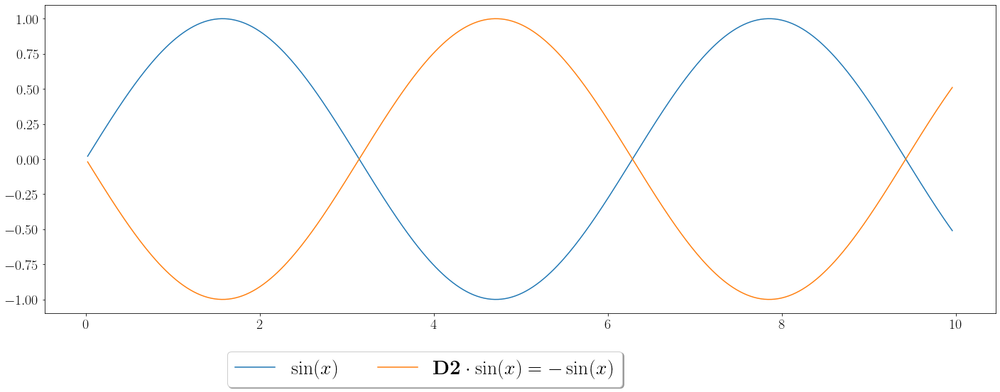

In [4]:
plt.plot(x[1:-1], np.sin(x)[1:-1], label=r"$\sin(x)$")
plt.plot(x[1:-1], D2.dot(np.sin(x))[1:-1], label=r"$\mathbf{D2} \cdot \sin(x) = -\sin(x)$")
plt.legend(fontsize=28,loc='upper center', bbox_to_anchor=(0.4, -0.09),fancybox=True, shadow=True, ncol=5)

## Solve Schrodinger Equation

Original 1-D Schrodinger equation: $-\frac{\hbar^2}{2m}\nabla^2\psi + V \psi = i\hbar\frac{\partial}{\partial t}\psi$


=> $\text{psi_t} \equiv \frac{\partial}{\partial t}\psi(t,x) = -i\left[-\frac{\hbar}{2m}\nabla^2\psi(t,x) + \frac{1}{\hbar} V(x) \psi(t,x)\right]$

In [5]:
# RHS of Schrodinger Equation
hbar = 1
# hbar = 1.0545718176461565e-34
def psi_t(t, psi):
    return -1j * (- 0.5 * hbar / m * D2.dot(psi) + V / hbar * psi)

In [6]:
dt = 0.05  # time interval for snapshots
t0 = 0.0    # initial time
tf = 1.0    # final time
t_eval = np.arange(t0, tf, dt)  # recorded time shots

# Solve the Initial Value Problem
sol = integrate.solve_ivp(psi_t, t_span = [t0, tf], y0 = psi0, t_eval = t_eval, method="RK23")

## Plotting

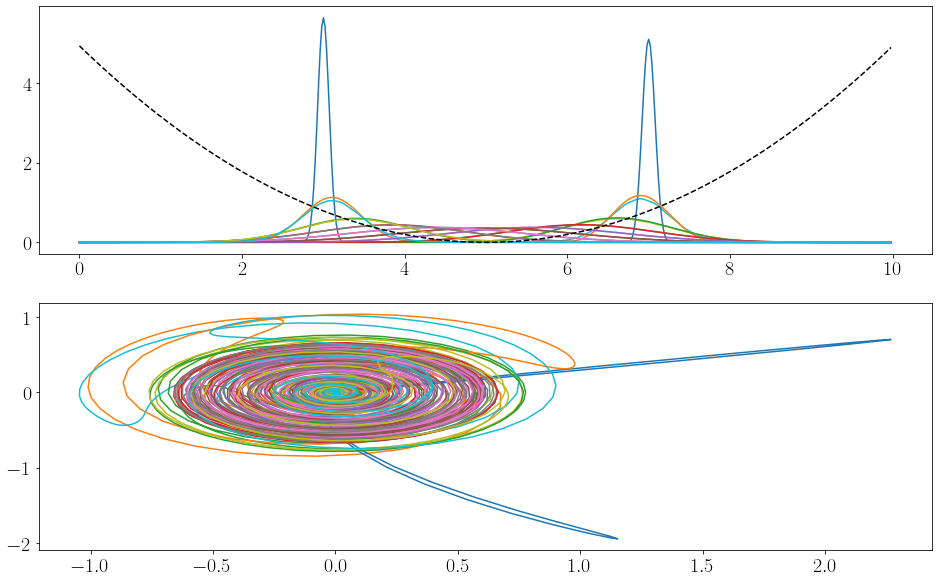

In [7]:
fig,ax=plt.subplots(2,1,figsize=(16,10))
for i, t in enumerate(sol.t):
    ax[0].plot(x, np.abs(sol.y[:,i])**2)             # Plot Wavefunctions
    ax[1].plot( np.real(sol.y[:,i]), np.imag(sol.y[:,i]))
#     print(np.sum(np.abs(sol.y[:,i])**2)*dx)        # Print Total Probability (Should = 1)
ax[0].plot(x, V * 0.01, "k--", label=r"$V(x) = \frac{1}{2}m\omega^2 (x-5)^2$")   # Plot Potential


## Animation

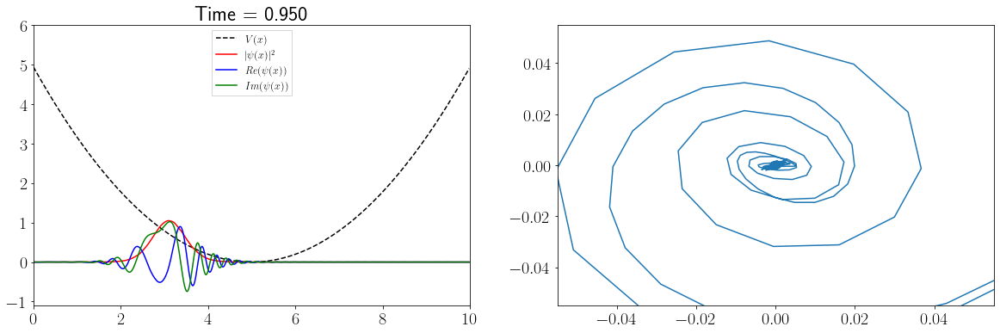

In [8]:
fig = plt.figure(figsize=(20,6))
ax1 = plt.subplot(1,2,1)
ax1.set_xlim(0, 10)
ax1.set_ylim(-1.1, 6)
title = ax1.set_title('')
line11, = ax1.plot([], [], "k--", label=r"$V(x) $")
line12, = ax1.plot([], [],'r',label=r"$\vert\psi(x)\vert^2$")
line13, = ax1.plot([], [],'b',label=r"$Re(\psi(x))$")
line14, = ax1.plot([], [],'g',label=r"$Im(\psi(x))$")
plt.legend(loc='upper center', fontsize=12, fancybox=False)

ax2 = plt.subplot(1,2,2)

line21, = ax2.plot([], [])

def init():
    line11.set_data(x, V * 0.01)
    return line11,line11,

def animate(i):
    line12.set_data(x, np.abs(sol.y[:,i])**2)
    line13.set_data(x, np.real(sol.y[:,i]))
    line14.set_data(x, np.imag(sol.y[:,i]))
    title.set_text('Time = {0:1.3f}'.format(sol.t[i]))
    line21.set_data(np.real(sol.y[:,i]),np.imag(sol.y[:,i]))
    return line11,line11,

anim = animation.FuncAnimation(fig, animate, init_func=init,frames=len(sol.t), interval=50, blit=True)
anim.save('sho@x.gif', writer='pillow', fps=20)
HTML(anim.to_jshtml())